- https://trello.com/c/KBbjZE02/16-dynamic-asset-allocation-market-timing

The quandl wiki bundle doesn't have SPY so I have to build my own bundle from yahoo.

```
%load_ext zipline
%pylab inline
figsize(12, 12)
```

In [12]:
# %load ~/.zipline/extension.py
from zipline.data.bundles import register, yahoo_equities

# these are the tickers you would like data for
equities = {
    'SPY',
}

register(
    'yahoo-spy',  # name this whatever you like
    yahoo_equities(equities),
)

<function zipline.data.bundles.yahoo.yahoo_equities.<locals>.ingest>

In [10]:
%matplotlib inline
import pyfolio as pf
import matplotlib.pyplot as plt

import sys
import logbook
import numpy as np
from datetime import datetime
import pytz

from zipline.algorithm import TradingAlgorithm
from zipline.utils.factory import load_from_yahoo
from zipline.finance import commission

from zipline.api import *

    zipline_logging = logbook.NestedSetup([
        logbook.NullHandler(level=logbook.DEBUG),
        logbook.StreamHandler(sys.stdout, level=logbook.INFO),
        logbook.StreamHandler(sys.stderr, level=logbook.ERROR),
    ])
    zipline_logging.push_application()

[2016-10-14 16:38:17.119375] INFO: Loader: Loading stock: SPY
[2016-10-14 16:38:57.574161] INFO: Performance: Simulated 5288 trading days out of 5288.
[2016-10-14 16:38:57.574809] INFO: Performance: first open: 1995-01-03 14:31:00+00:00
[2016-10-14 16:38:57.575298] INFO: Performance: last close: 2015-12-31 21:00:00+00:00
Entire data start date: 1995-01-03
Entire data end date: 2015-12-31


Backtest Months: 251
                   Backtest
annual_return          0.09
annual_volatility      0.20
sharpe_ratio           0.55
calmar_ratio           0.17
stability              0.71
max_drawdown          -0.55
omega_ratio            1.11
sortino_ratio          0.79
skewness               0.11
kurtosis              10.19
information_ratio     -0.02
alpha                 -0.00
beta                   1.00

Worst Drawdown Periods
   net drawdown in %  peak date valley date recovery date duration
0              55.19 2007-10-09  2009-03-09    2012-08-16     1268
1              47.52 2000-03-24  200

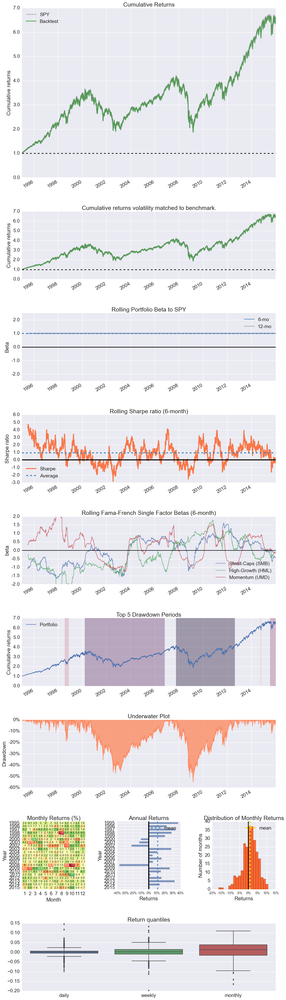


Stress Events
                                    mean    min    max
Dotcom                             0.001 -0.057  0.047
Lehmann                           -0.002 -0.078  0.041
9/11                               0.000 -0.052  0.035
US downgrade/European Debt Crisis -0.001 -0.065  0.047
Fukushima                          0.001 -0.019  0.015
US Housing                        -0.005 -0.026  0.019
EZB IR Event                      -0.000 -0.011  0.015
Aug07                              0.001 -0.030  0.020
Mar08                              0.001 -0.025  0.042
Sept08                            -0.004 -0.078  0.041
2009Q1                            -0.005 -0.053  0.043
2009Q2                             0.004 -0.045  0.072
Flash Crash                       -0.003 -0.033  0.044
Apr14                              0.000 -0.021  0.011
Oct14                              0.001 -0.020  0.020
Fall2015                          -0.002 -0.042  0.038
Low Volatility Bull Market         0.000 -0.039  0

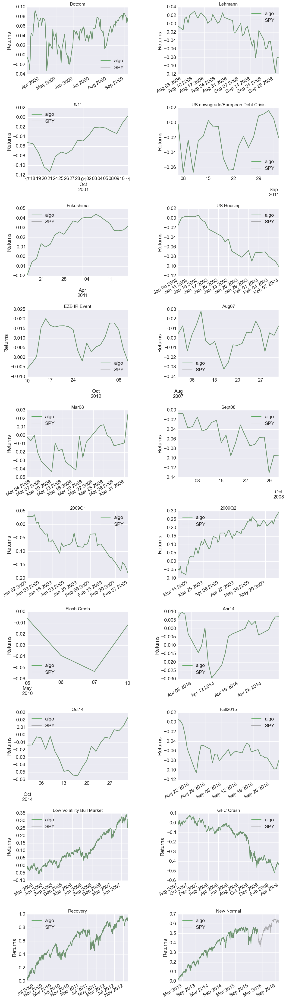



Top 10 long positions of all time (and max%)
[ Equity(0, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('1995-01-03 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 1.005]


Top 10 short positions of all time (and max%)
[]
[]


Top 10 positions of all time (and max%)
[ Equity(0, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('1995-01-03 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 1.005]


All positions ever held
[ Equity(0, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('1995-01-03 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 1.005]




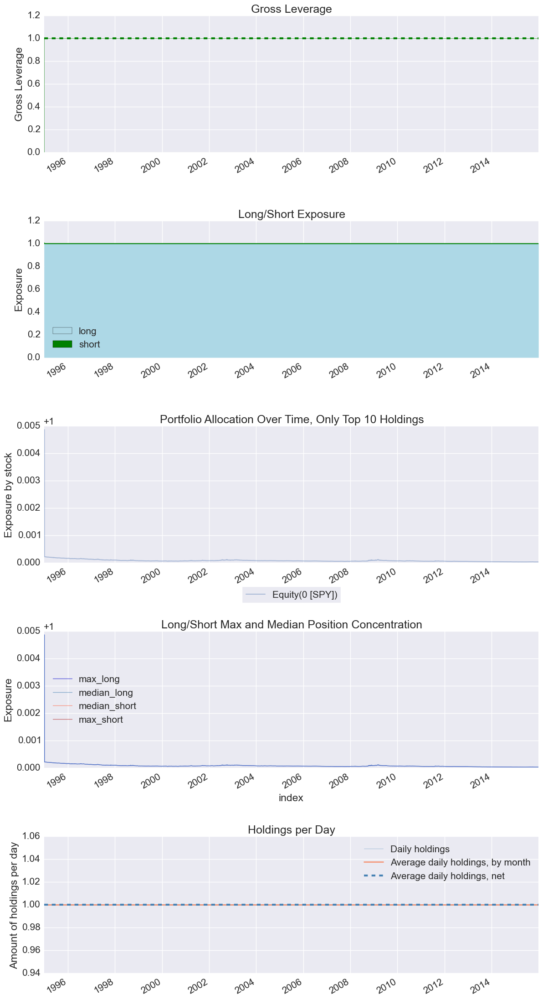

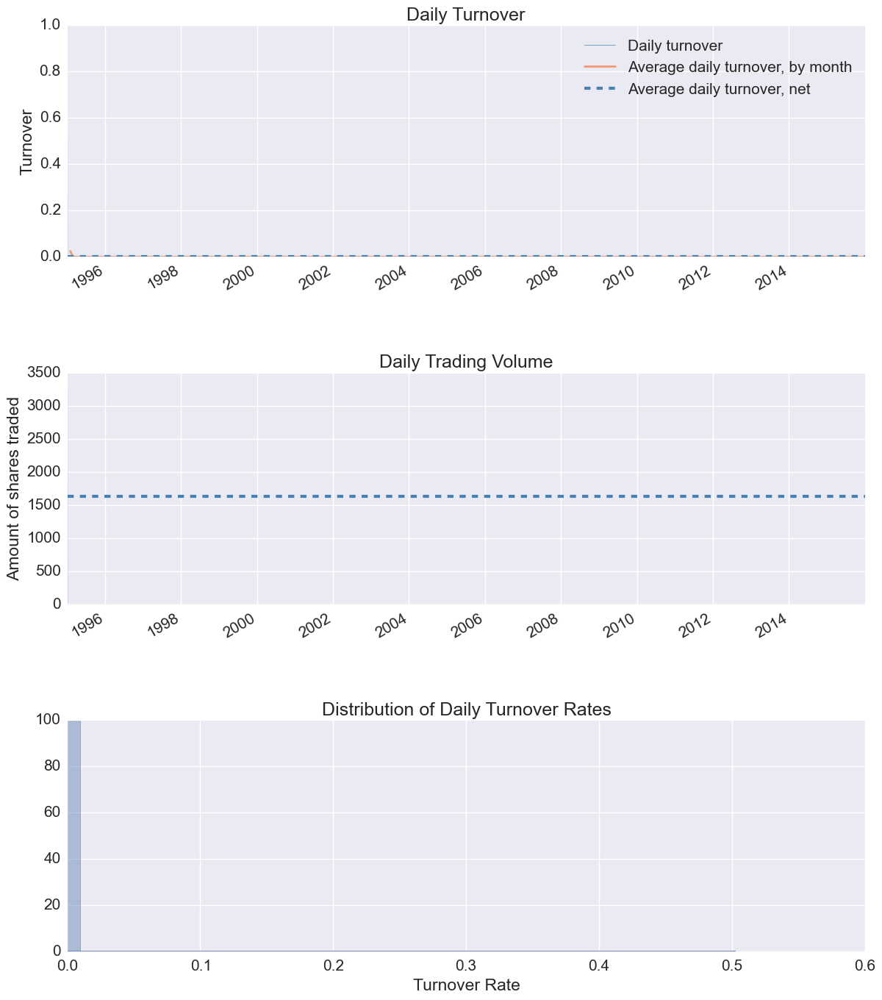

/Users/jcurzon/anaconda/envs/zipline/lib/python3.4/site-packages/pyfolio/tears.py:544: UserWarning: Fewer than 5 round-trip trades made.
               Skipping round trip tearsheet.
  Skipping round trip tearsheet.""", UserWarning)


In [2]:
def initialize(context):
    context.sid = symbol("SPY") #spy

def handle_data(context, data):
    order_target_percent(context.sid, 1)
    
start = datetime(1995, 1, 1, 0, 0, 0, 0, pytz.utc)
end = datetime(2016, 1, 1, 0, 0, 0, 0, pytz.utc)

# Load price data from yahoo.
data = load_from_yahoo(stocks=["SPY"], indexes={}, start=start, end=end)
data = data.dropna()

# Create and run the algorithm.
algo = TradingAlgorithm(handle_data=handle_data, initialize=initialize)
results = algo.run(data)

returns, positions, transactions, gross_lev = pf.utils.extract_rets_pos_txn_from_zipline(results)

pf.create_full_tear_sheet(returns, positions=positions,
                          transactions=transactions, gross_lev=gross_lev, round_trips=True)

[2016-10-14 16:40:37.487502] INFO: Loader: Loading stock: SPY
[2016-10-14 16:41:10.545891] INFO: Performance: Simulated 5288 trading days out of 5288.
[2016-10-14 16:41:10.546421] INFO: Performance: first open: 1995-01-03 14:31:00+00:00
[2016-10-14 16:41:10.546964] INFO: Performance: last close: 2015-12-31 21:00:00+00:00
Entire data start date: 1995-01-03
Entire data end date: 2015-12-31


Backtest Months: 251
                   Backtest
annual_return          0.07
annual_volatility      0.14
sharpe_ratio           0.55
calmar_ratio           0.16
stability              0.73
max_drawdown          -0.45
omega_ratio            1.11
sortino_ratio          0.78
skewness               0.02
kurtosis               8.66
information_ratio     -0.04
alpha                 -0.00
beta                   0.74

Worst Drawdown Periods
   net drawdown in %  peak date valley date recovery date duration
0              44.58 2007-10-09  2009-03-09    2012-03-13     1156
1              37.77 2000-03-24  200

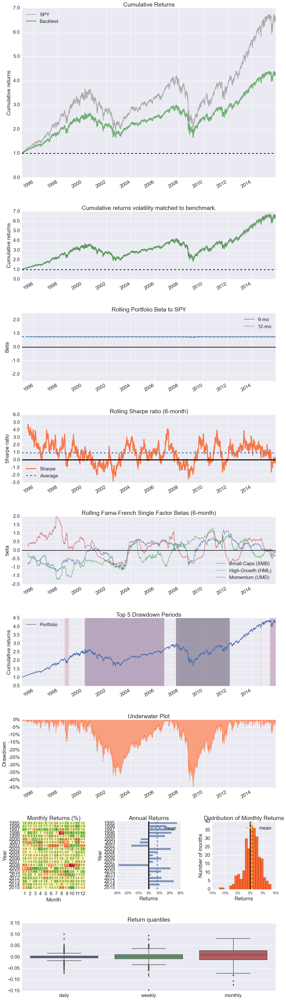


Stress Events
                                    mean    min    max
Dotcom                             0.000 -0.042  0.035
Lehmann                           -0.001 -0.058  0.030
9/11                               0.000 -0.039  0.025
US downgrade/European Debt Crisis -0.000 -0.048  0.034
Fukushima                          0.001 -0.014  0.012
US Housing                        -0.004 -0.020  0.014
EZB IR Event                      -0.000 -0.008  0.011
Aug07                              0.000 -0.022  0.015
Mar08                              0.001 -0.019  0.031
Sept08                            -0.003 -0.058  0.030
2009Q1                            -0.004 -0.039  0.031
2009Q2                             0.003 -0.033  0.055
Flash Crash                       -0.002 -0.025  0.032
Apr14                              0.000 -0.016  0.008
Oct14                              0.001 -0.015  0.015
Fall2015                          -0.002 -0.031  0.028
Low Volatility Bull Market         0.000 -0.029  0

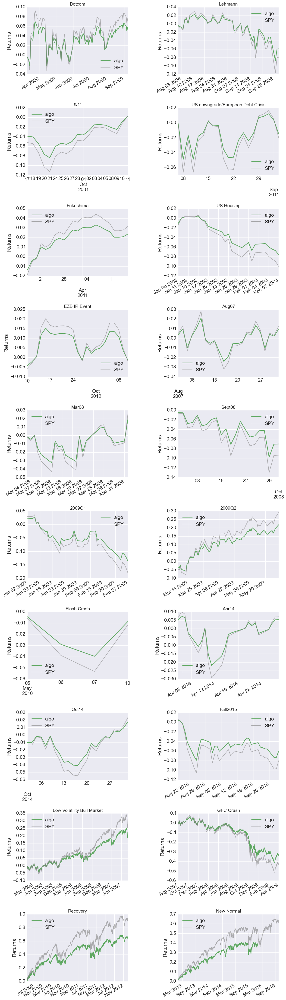



Top 10 long positions of all time (and max%)
[ Equity(0, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('1995-01-03 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 0.78]


Top 10 short positions of all time (and max%)
[]
[]


Top 10 positions of all time (and max%)
[ Equity(0, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('1995-01-03 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 0.78]


All positions ever held
[ Equity(0, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('1995-01-03 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 0.78]




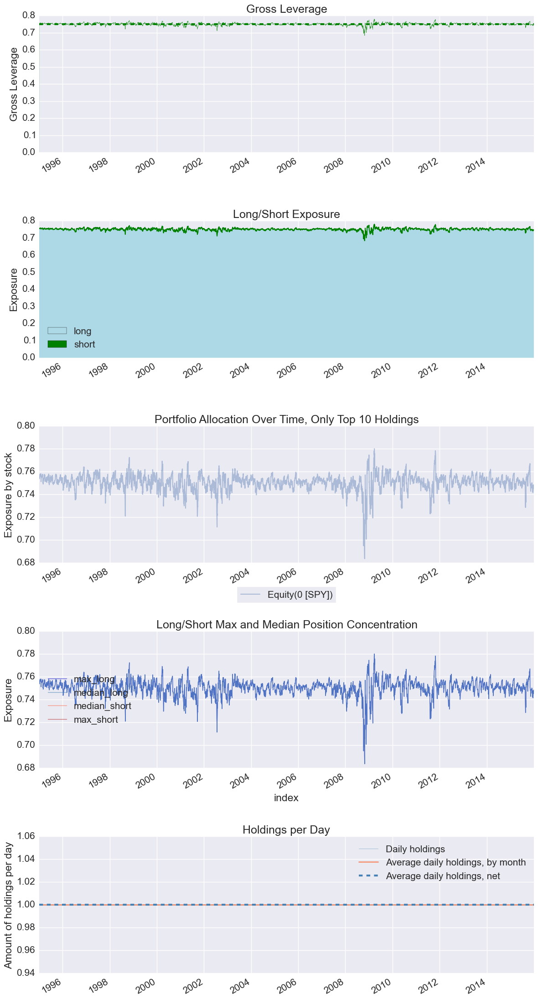

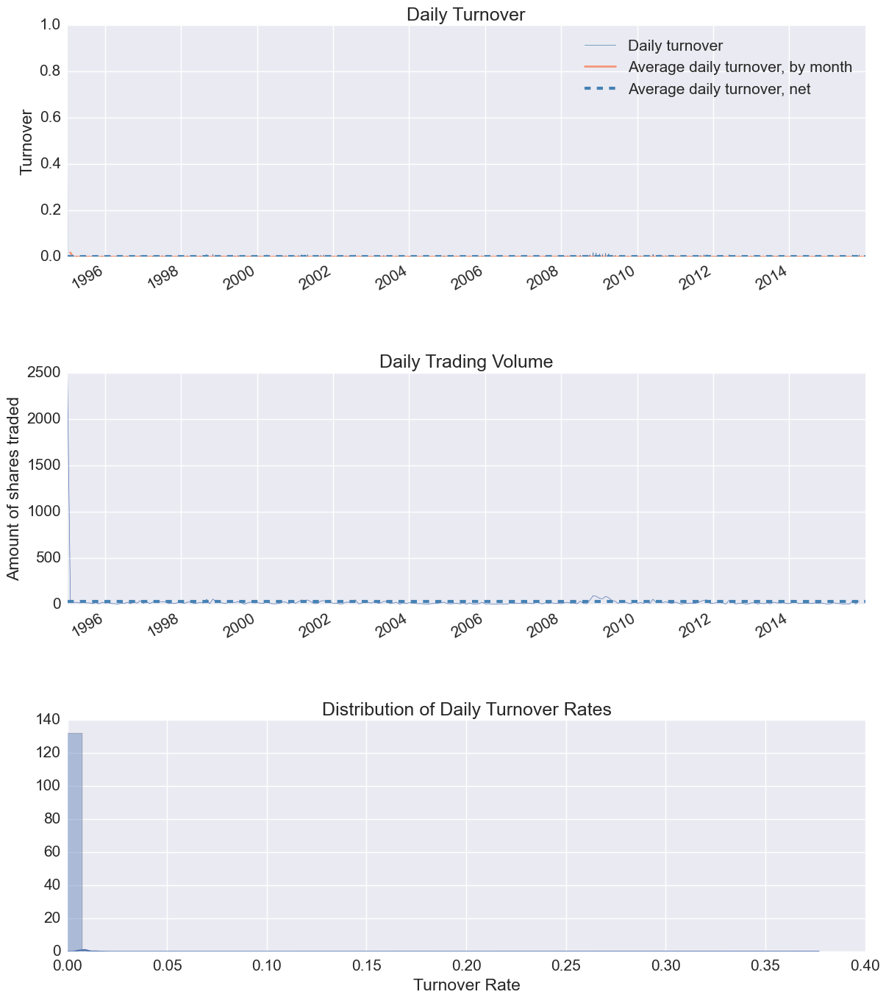

/Users/jcurzon/anaconda/envs/zipline/lib/python3.4/site-packages/pyfolio/tears.py:544: UserWarning: Fewer than 5 round-trip trades made.
               Skipping round trip tearsheet.
  Skipping round trip tearsheet.""", UserWarning)


In [3]:
# This is a simple rebalancing strategy

def initialize(context):
    context.sid = symbol("SPY") #spy
        
    schedule_function(rebalance,
                      date_rule=date_rules.month_start(),
                      time_rule=time_rules.market_open())
    
def rebalance(context, data):
    order_target_percent(context.sid, 0.75)

def handle_data(context, data):
    pass
    
start = datetime(1995, 1, 1, 0, 0, 0, 0, pytz.utc)
end = datetime(2016, 1, 1, 0, 0, 0, 0, pytz.utc)

# Load price data from yahoo.
data = load_from_yahoo(stocks=["SPY"], indexes={}, start=start, end=end)
data = data.dropna()

# Create and run the algorithm.
algo = TradingAlgorithm(handle_data=handle_data, initialize=initialize)
results = algo.run(data)

returns, positions, transactions, gross_lev = pf.utils.extract_rets_pos_txn_from_zipline(results)

pf.create_full_tear_sheet(returns, positions=positions,
                          transactions=transactions, gross_lev=gross_lev, round_trips=True)


[2016-10-14 17:00:59.680939] INFO: Loader: Loading stock: SPY
[2016-10-14 17:00:59.693901] INFO: Loader: Loading stock: LQD
[2016-10-14 17:01:22.622946] INFO: Performance: Simulated 3381 trading days out of 3381.
[2016-10-14 17:01:22.623827] INFO: Performance: first open: 2002-07-30 13:31:00+00:00
[2016-10-14 17:01:22.624385] INFO: Performance: last close: 2015-12-31 21:00:00+00:00
Entire data start date: 2002-07-30
Entire data end date: 2015-12-31


Backtest Months: 161
                   Backtest
annual_return          0.08
annual_volatility      0.12
sharpe_ratio           0.68
calmar_ratio           0.20
stability              0.85
max_drawdown          -0.39
omega_ratio            1.14
sortino_ratio          0.97
skewness               0.24
kurtosis              21.83
information_ratio     -0.01
alpha                  0.02
beta                   0.60

Worst Drawdown Periods
   net drawdown in %  peak date valley date recovery date duration
0              39.37 2007-10-10  2009-03-

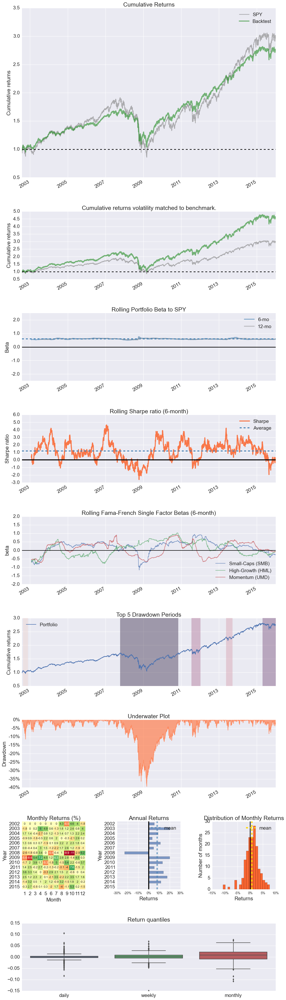


Stress Events
                                    mean    min    max
Lehmann                           -0.002 -0.083  0.063
US downgrade/European Debt Crisis -0.001 -0.042  0.030
Fukushima                          0.001 -0.009  0.008
US Housing                        -0.003 -0.014  0.012
EZB IR Event                       0.000 -0.006  0.011
Aug07                              0.001 -0.018  0.012
Mar08                              0.001 -0.013  0.024
Sept08                            -0.004 -0.083  0.063
2009Q1                            -0.004 -0.037  0.023
2009Q2                             0.003 -0.028  0.046
Flash Crash                       -0.003 -0.026  0.028
Apr14                              0.001 -0.012  0.007
Oct14                              0.001 -0.014  0.012
Fall2015                          -0.001 -0.026  0.022
Low Volatility Bull Market         0.000 -0.022  0.014
GFC Crash                         -0.001 -0.083  0.105
Recovery                           0.001 -0.042  0

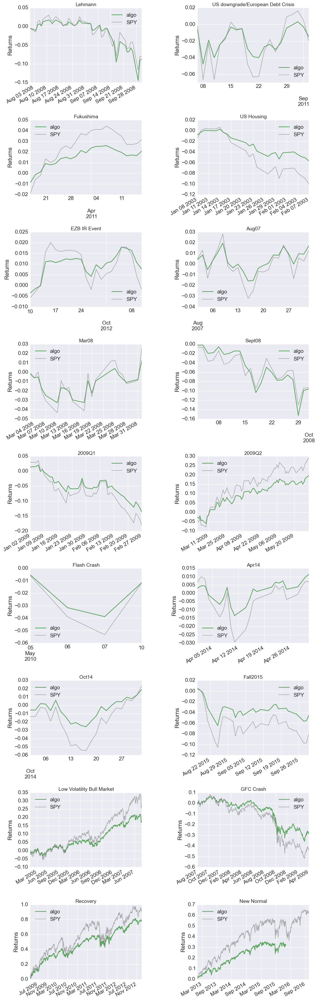



Top 10 long positions of all time (and max%)
[ Equity(1, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('2002-07-30 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')
 Equity(0, symbol='LQD', asset_name='', exchange='TEST', start_date=Timestamp('2002-07-30 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 0.641  0.472]


Top 10 short positions of all time (and max%)
[]
[]


Top 10 positions of all time (and max%)
[ Equity(1, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('2002-07-30 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')
 Equity(0, symbol='LQD', asset_name='', exchange='TEST', start_date=Timestamp('2002-07-30 00:00:00+0000', tz=

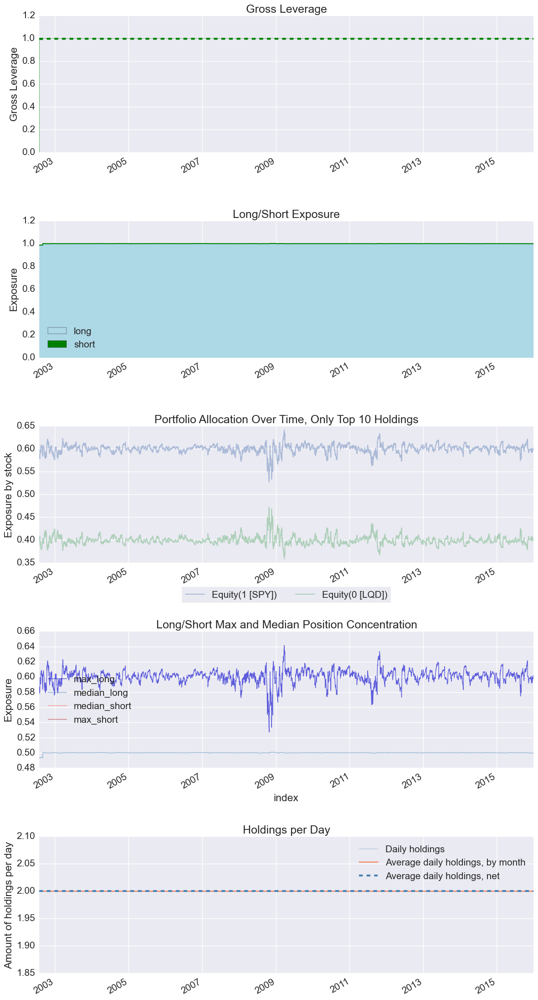

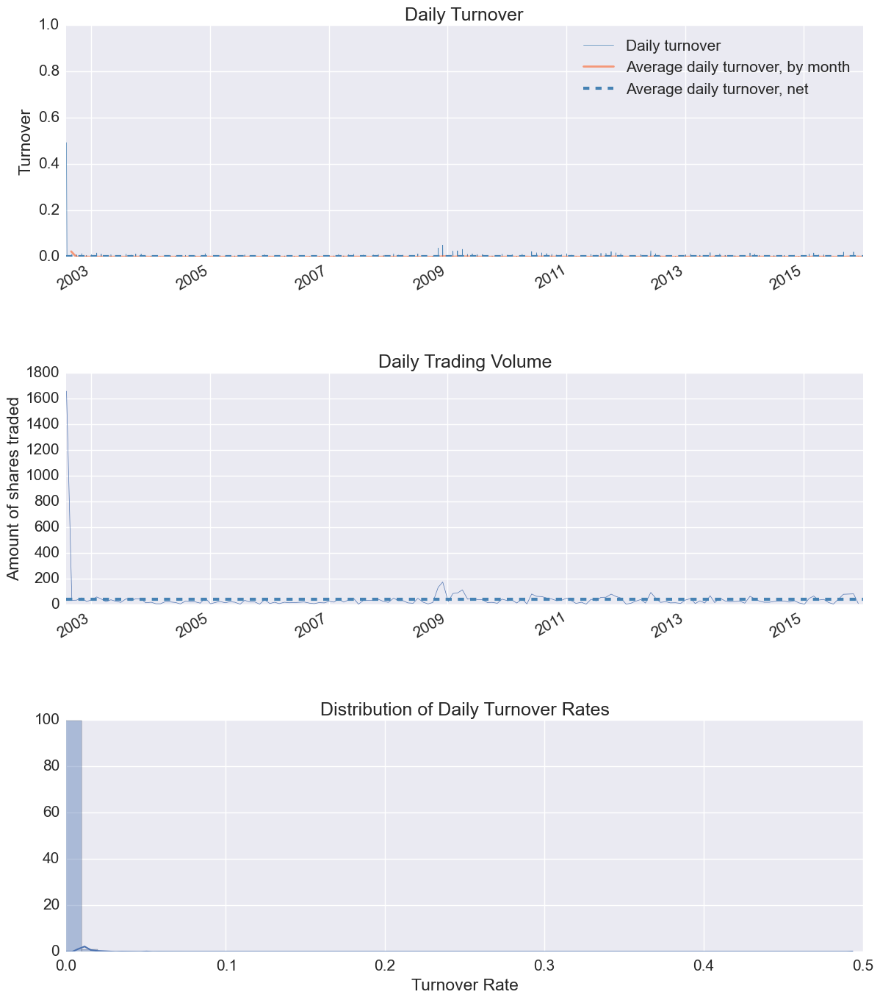

/Users/jcurzon/anaconda/envs/zipline/lib/python3.4/site-packages/pyfolio/tears.py:544: UserWarning: Fewer than 5 round-trip trades made.
               Skipping round trip tearsheet.
  Skipping round trip tearsheet.""", UserWarning)


In [7]:
# This is a simple rebalancing strategy

def initialize(context):
    schedule_function(rebalance,
                      date_rule=date_rules.month_start(),
                      time_rule=time_rules.market_open())
    
def rebalance(context, data):
    order_target_percent(symbol("SPY"), 0.6)
    order_target_percent(symbol("LQD"), 0.4)

def handle_data(context, data):
    pass
    
start = datetime(1995, 1, 1, 0, 0, 0, 0, pytz.utc)
end = datetime(2016, 1, 1, 0, 0, 0, 0, pytz.utc)

# Load price data from yahoo.
data = load_from_yahoo(stocks=["SPY", "LQD"], indexes={}, start=start, end=end)
data = data.dropna()

# Create and run the algorithm.
algo = TradingAlgorithm(handle_data=handle_data, initialize=initialize)
results = algo.run(data)

returns, positions, transactions, gross_lev = pf.utils.extract_rets_pos_txn_from_zipline(results)

pf.create_full_tear_sheet(returns, positions=positions,
                          transactions=transactions, gross_lev=gross_lev, round_trips=True)


The conclusion is that simply rebalaning over stocks and cash doesn't increase your return. But it would keep a minimum amount of money in the bank. The traditional 60/40 stock and bonds portfolio is actually pretty nice.

- http://www.bsam.com/2016/07/25/proper-benchmark-momentum-trend-following-strategies/
- https://www.quantopian.com/posts/quick-and-dirty-momentum-strategy

[2016-10-18 04:22:59.235093] INFO: Loader: Loading stock: SPY
[2016-10-18 04:23:18.338734] INFO: Performance: Simulated 3170 trading days out of 3170.
[2016-10-18 04:23:18.339288] INFO: Performance: first open: 2003-06-02 13:31:00+00:00
[2016-10-18 04:23:18.339786] INFO: Performance: last close: 2015-12-31 21:00:00+00:00
Entire data start date: 2003-06-02
Entire data end date: 2015-12-31


Backtest Months: 150
                   Backtest
annual_return          0.09
annual_volatility      0.12
sharpe_ratio           0.79
calmar_ratio           0.55
stability              0.96
max_drawdown          -0.17
omega_ratio            1.16
sortino_ratio          1.11
skewness              -0.46
kurtosis               5.52
information_ratio      0.00
alpha                  0.06
beta                   0.43

Worst Drawdown Periods
   net drawdown in %  peak date valley date recovery date duration
1              17.30 2011-04-29  2011-08-08    2012-09-13      360
2              15.05 2010-04-23  201

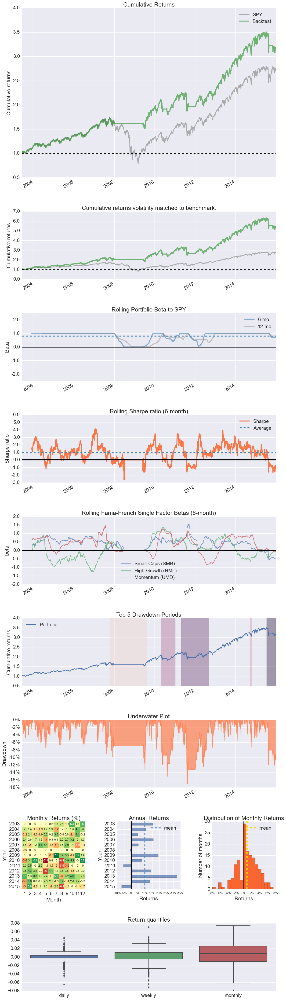


Stress Events
                                    mean    min    max
Lehmann                            0.000  0.000  0.000
US downgrade/European Debt Crisis -0.001 -0.065  0.046
Fukushima                          0.001 -0.019  0.015
EZB IR Event                      -0.000 -0.011  0.015
Aug07                              0.001 -0.030  0.020
Mar08                              0.000  0.000  0.000
Sept08                             0.000  0.000  0.000
2009Q1                             0.000  0.000  0.000
2009Q2                             0.000  0.000  0.000
Flash Crash                       -0.003 -0.033  0.044
Apr14                              0.000 -0.021  0.011
Oct14                              0.001 -0.020  0.020
Fall2015                          -0.002 -0.042  0.038
Low Volatility Bull Market         0.000 -0.039  0.021
GFC Crash                          0.000 -0.030  0.032
Recovery                           0.000 -0.065  0.046
New Normal                         0.000 -0.042  0

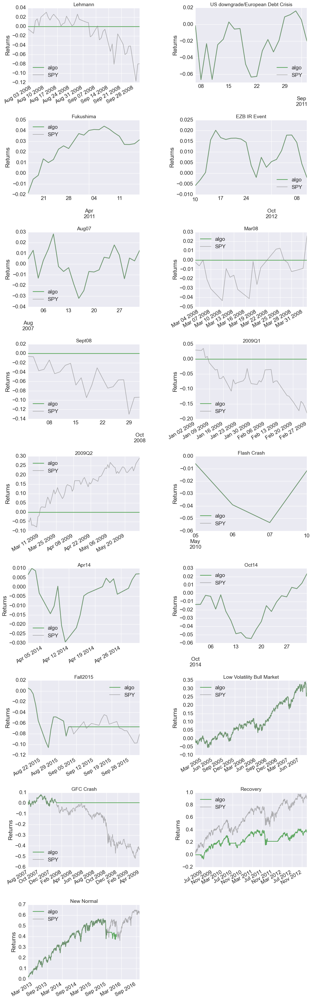



Top 10 long positions of all time (and max%)
[ Equity(0, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('1995-01-03 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 1.004]


Top 10 short positions of all time (and max%)
[]
[]


Top 10 positions of all time (and max%)
[ Equity(0, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('1995-01-03 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 1.004]


All positions ever held
[ Equity(0, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('1995-01-03 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 1.004]




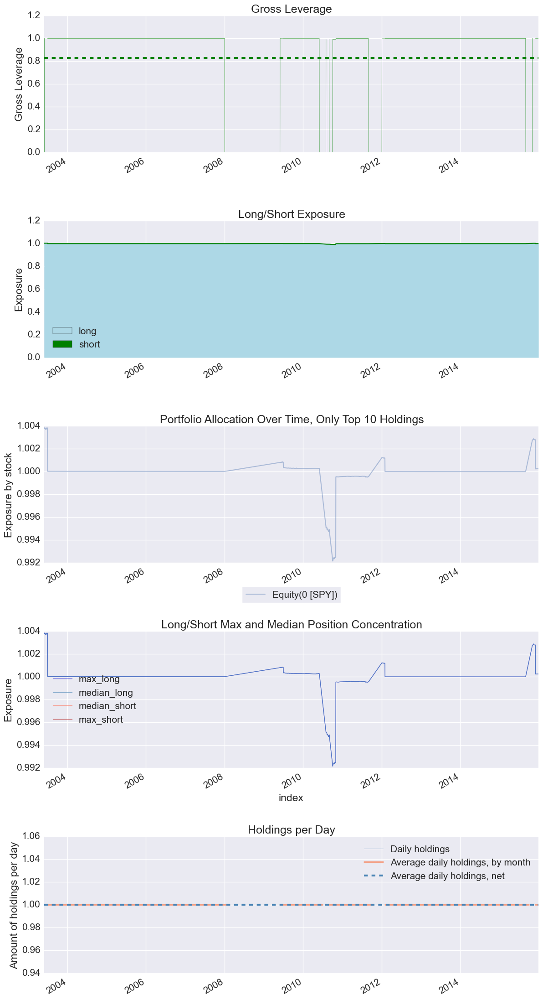

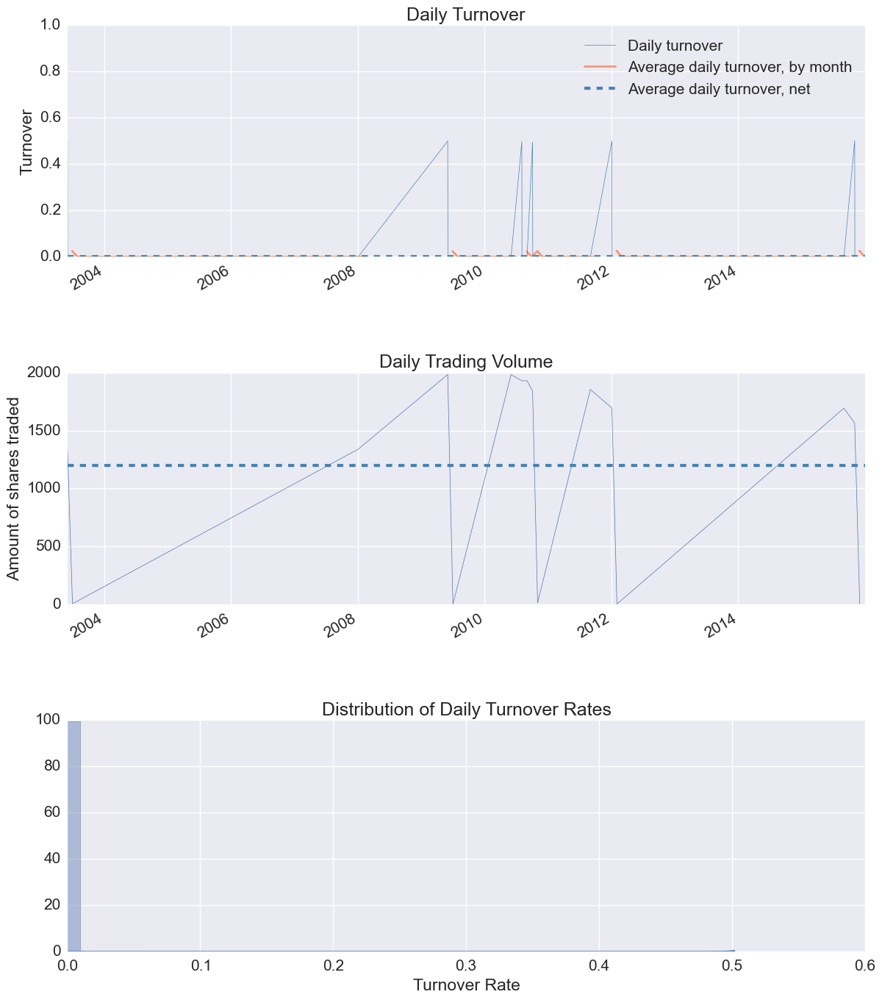

                       duration            pnl   returns  long
count                         6       6.000000  6.000000     6
mean   633 days 00:00:00.166666   35542.868239  0.239624     1
std    698 days 04:52:29.602663   51308.264872  0.309724     0
min            30 days 00:00:00   -9045.143388 -0.027999  True
25%    126 days 18:00:00.750000   -1129.108940 -0.005671     1
50%           349 days 00:00:00   19795.433815  0.118628     1
75%          1094 days 00:00:00   53565.109150  0.505281     1
max          1675 days 00:00:00  125993.774123  0.641425  True
Percent of round trips profitable = 66.67%
Mean return per winning round trip = 0.3726
Mean return per losing round trip = -0.02625
A decision is made every 437.2 days.
0.002287 trading decisions per day.
0.04804 trading decisions per month.

Profitability (PnL / PnL total) per name:
symbol
Equity(0 [SPY])    1
Name: pnl, dtype: float64


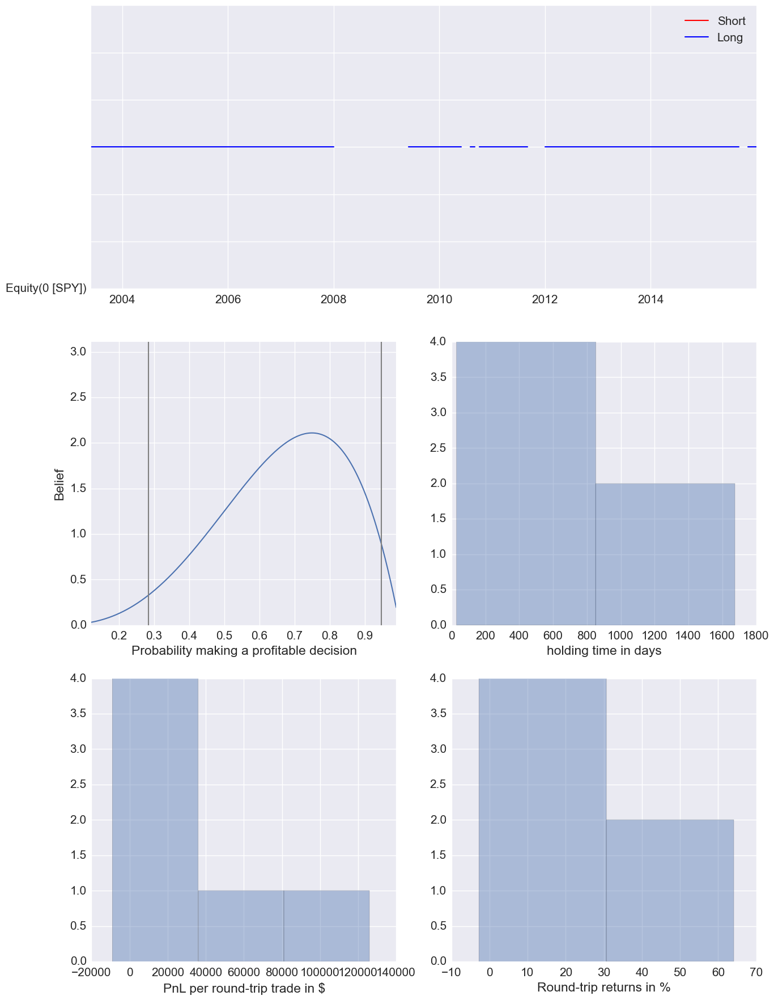

In [17]:
# 200 day moving average strategy

def initialize(context):
    context.sid = symbol("SPY") #spy
        
    schedule_function(rebalance,
                      date_rule=date_rules.month_start(),
                      time_rule=time_rules.market_open())
    
def rebalance(context, data):
    price_history = data.history(context.sid, 'price', 200, '1d')
    if data.current(context.sid, "close") > price_history.mean():
        order_target_percent(context.sid, 1)
    else:
        order_target_percent(context.sid, 0)
    

def handle_data(context, data):
    pass

start_data = datetime(1995, 1, 1, 0, 0, 0, 0, pytz.utc)
#start_backtest = datetime(1996, 1, 1, 0, 0, 0, 0, pytz.utc)
start_backtest = datetime(2003, 6, 1, 0, 0, 0, 0, pytz.utc)
end = datetime(2016, 1, 1, 0, 0, 0, 0, pytz.utc)

# Load price data from yahoo.
data = load_from_yahoo(stocks=["SPY"], indexes={}, start=start_data, end=end)
data = data.dropna()

from zipline.utils.factory import create_simulation_parameters

# Create and run the algorithm.
algo = TradingAlgorithm(
    handle_data=handle_data,
    initialize=initialize,
    sim_params=create_simulation_parameters(
        start=start_backtest,
        end=end,
        data_frequency='daily',
    ),
)
results = algo.run(data, False)

returns, positions, transactions, gross_lev = pf.utils.extract_rets_pos_txn_from_zipline(results)

pf.create_full_tear_sheet(returns, positions=positions,
                          transactions=transactions, gross_lev=gross_lev, round_trips=True)

[2016-10-18 04:18:46.849909] INFO: Loader: Loading stock: SPY
[2016-10-18 04:18:46.861946] INFO: Loader: Loading stock: SHY
[2016-10-18 04:19:13.590773] INFO: Performance: Simulated 3170 trading days out of 3170.
[2016-10-18 04:19:13.591324] INFO: Performance: first open: 2003-06-02 13:31:00+00:00
[2016-10-18 04:19:13.591855] INFO: Performance: last close: 2015-12-31 21:00:00+00:00


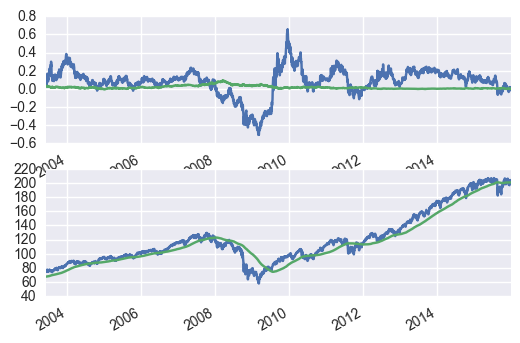

Entire data start date: 2003-06-02
Entire data end date: 2015-12-31


Backtest Months: 150
                   Backtest
annual_return          0.08
annual_volatility      0.13
sharpe_ratio           0.66
calmar_ratio           0.37
stability              0.93
max_drawdown          -0.21
omega_ratio            1.13
sortino_ratio          0.91
skewness              -0.49
kurtosis               5.57
information_ratio     -0.01
alpha                  0.04
beta                   0.41

Worst Drawdown Periods
   net drawdown in %  peak date valley date recovery date duration
0              20.73 2010-04-23  2010-08-26    2013-03-11      752
1              12.36 2015-07-20  2015-12-18           NaT      NaN
3               9.93 2007-10-09  2007-11-26    2009-08-13      483
4               7.97 2010-01-19  2010-02-08    2010-03-11       38
2               7.27 2014-09-18  2014-10-16    2014-10-31       32


2-sigma returns daily    -0.016
2-sigma returns weekly   -0.029
dtype: float64


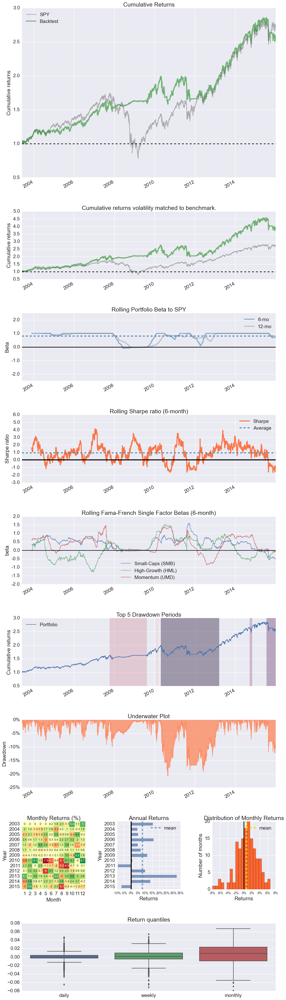


Stress Events
                                    mean    min    max
Lehmann                            0.000 -0.006  0.007
US downgrade/European Debt Crisis -0.001 -0.065  0.046
Fukushima                          0.001 -0.019  0.015
EZB IR Event                      -0.000 -0.011  0.015
Aug07                              0.001 -0.030  0.020
Mar08                             -0.000 -0.005  0.003
Sept08                             0.000 -0.006  0.007
2009Q1                            -0.000 -0.005  0.003
2009Q2                             0.000 -0.002  0.004
Flash Crash                       -0.003 -0.033  0.044
Apr14                              0.000 -0.021  0.011
Oct14                              0.001 -0.020  0.020
Fall2015                          -0.002 -0.042  0.038
Low Volatility Bull Market         0.000 -0.039  0.021
GFC Crash                          0.000 -0.030  0.032
Recovery                           0.000 -0.065  0.046
New Normal                         0.000 -0.042  0

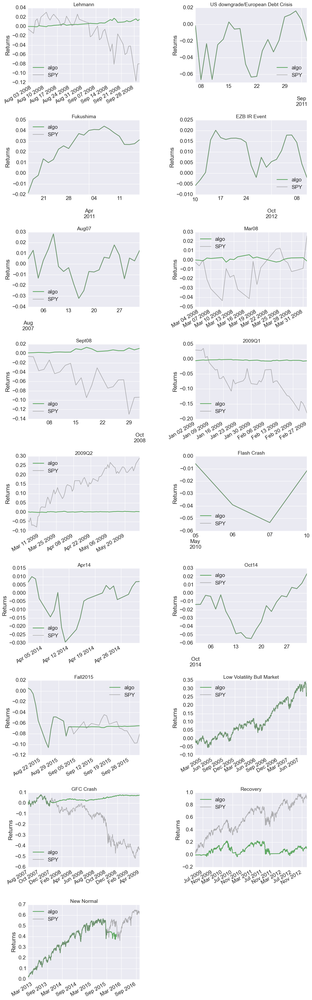



Top 10 long positions of all time (and max%)
[ Equity(0, symbol='SHY', asset_name='', exchange='TEST', start_date=Timestamp('2002-07-30 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')
 Equity(1, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('2002-07-30 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')]
[ 1.009  1.004]


Top 10 short positions of all time (and max%)
[]
[]


Top 10 positions of all time (and max%)
[ Equity(0, symbol='SHY', asset_name='', exchange='TEST', start_date=Timestamp('2002-07-30 00:00:00+0000', tz='UTC'), end_date=Timestamp('2015-12-31 00:00:00+0000', tz='UTC'), first_traded=None, auto_close_date=None, exchange_full='TEST FULL')
 Equity(1, symbol='SPY', asset_name='', exchange='TEST', start_date=Timestamp('2002-07-30 00:00:00+0000', tz=

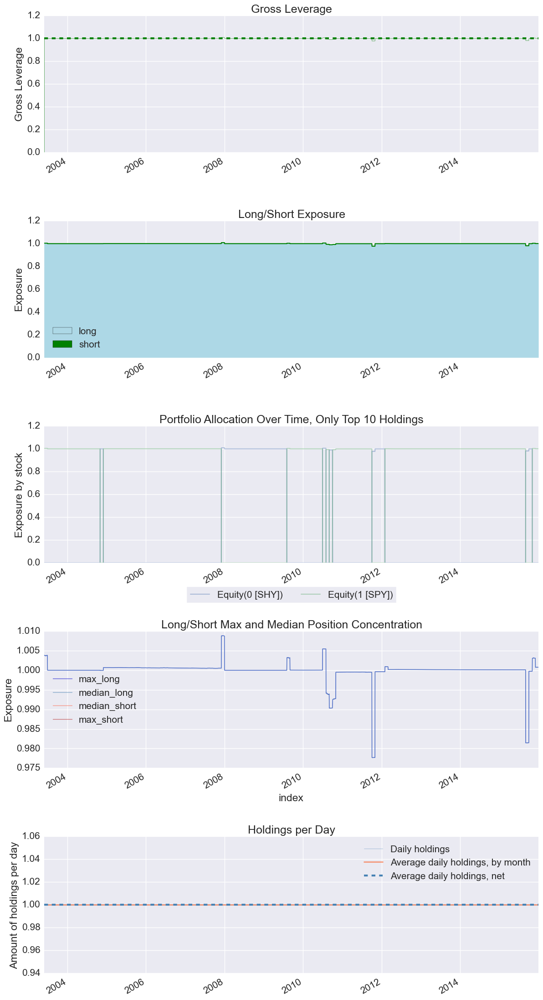

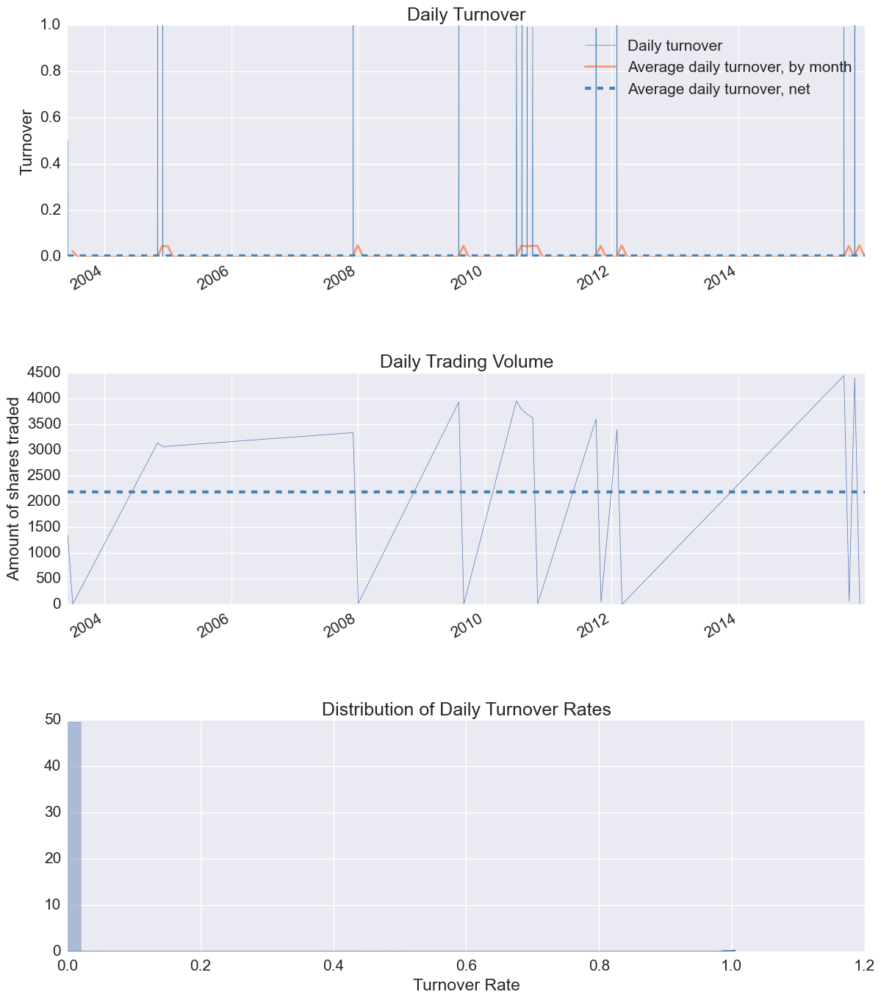

                       duration           pnl    returns  long
count                        13     13.000000  13.000000    13
mean   353 days 09:13:50.846153  11978.440096   0.085827     1
std    428 days 02:15:33.339925  27715.704607   0.175418     0
min            30 days 00:00:00  -7380.430348  -0.028003  True
25%            32 days 00:00:00     46.595625   0.000177     1
50%           121 days 00:00:00    464.867520   0.002750     1
75%           518 days 00:00:00   9620.027777   0.062329     1
max          1308 days 00:00:00  96530.275249   0.580106  True
Percent of round trips profitable = 76.92%
Mean return per winning round trip = 0.1174
Mean return per losing round trip = -0.01927
A decision is made every 243.8 days.
0.004102 trading decisions per day.
0.08615 trading decisions per month.

Profitability (PnL / PnL total) per name:
symbol
Equity(1 [SPY])    0.934155
Equity(0 [SHY])    0.065845
Name: pnl, dtype: float64


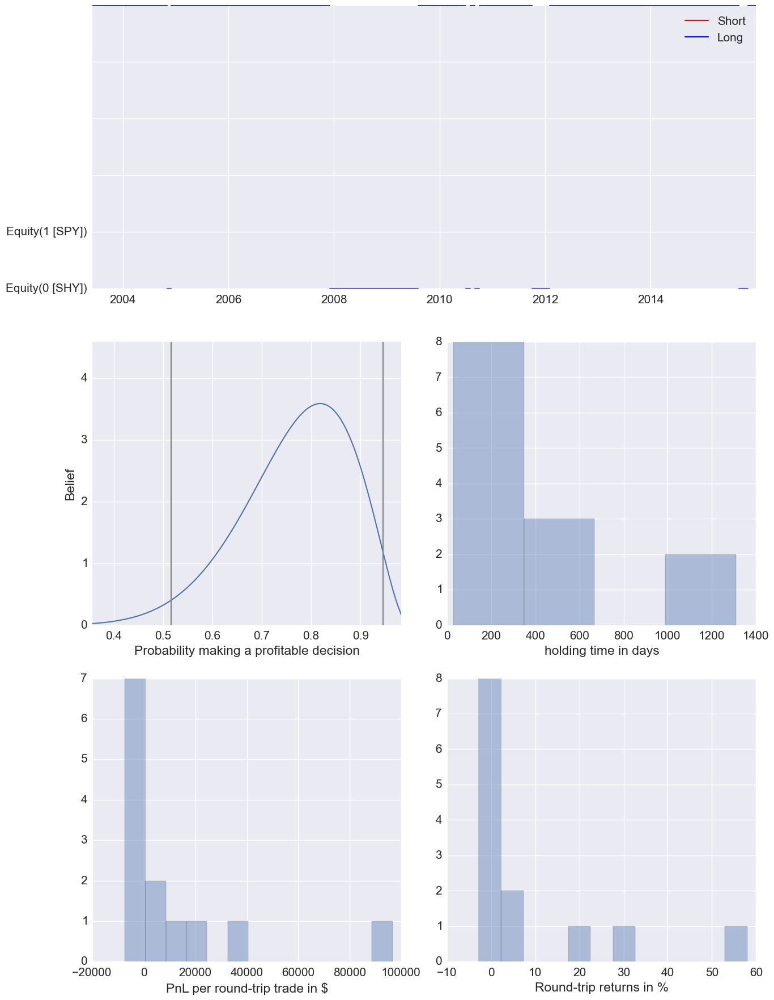

In [16]:
# momentum

def initialize(context):
    context.sid = symbol("SPY")
    context.cash = symbol("SHY")
        
    schedule_function(rebalance,
                      date_rule=date_rules.month_start(),
                      time_rule=time_rules.market_open())
    
def calcMom(sid, data):
    history = data.history(sid, 'price', 200, '1d')
    now = history.ix[-1]
    old = history.ix[0]
    return (now - old) / old
    
def rebalance(context, data):
    equityMom = calcMom(context.sid, data)
    cashMom = calcMom(context.cash, data)
    if equityMom > cashMom:
        order_target_percent(context.sid, 1)
        order_target(context.cash, 0)
    else:
        order_target_percent(context.cash, 1)
        order_target(context.sid, 0)
    

def handle_data(context, data):
    record(
        spyMom=calcMom(context.sid, data),
        cashMom=calcMom(context.cash, data),
        spyPrice=data.current(context.sid, 'price'),
        spySMA=data.history(context.sid, 'price', 200, '1d').mean()
    )

    pass

def analyze(context, perf):
    ax1 = plt.subplot(211)
    perf.spyMom.plot(ax=ax1)
    perf.cashMom.plot(ax=ax1)
    ax2 = plt.subplot(212)
    perf.spyPrice.plot(ax=ax2)
    perf.spySMA.plot(ax=ax2)

    plt.show()


# Apparently SHY started in 2003
start_data = datetime(1995, 1, 1, 0, 0, 0, 0, pytz.utc)
start_backtest = datetime(2003, 6, 1, 0, 0, 0, 0, pytz.utc)
end = datetime(2016, 1, 1, 0, 0, 0, 0, pytz.utc)

# Load price data from yahoo.
data = load_from_yahoo(stocks=["SPY", "SHY"], indexes={}, start=start_data, end=end)
data = data.dropna()

from zipline.utils.factory import create_simulation_parameters

# Create and run the algorithm.
algo = TradingAlgorithm(
    handle_data=handle_data,
    initialize=initialize,
    analyze=analyze,
    sim_params=create_simulation_parameters(
        start=start_backtest,
        end=end,
        data_frequency='daily',
    ),
)
results = algo.run(data, False)

returns, positions, transactions, gross_lev = pf.utils.extract_rets_pos_txn_from_zipline(results)

pf.create_full_tear_sheet(returns, positions=positions,
                          transactions=transactions, gross_lev=gross_lev, round_trips=True)